In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline
import glob


In [2]:
class Camera:
    def __init__(self):
        pass
    
    def calibrate(self, image_names, nx, ny, plot_corners=False):
    
        # termination criteria
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(nx-1,ny-1,0)
        objp = np.zeros((nx*ny, 3), np.float32)
        objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d point in real world space
        imgpoints = [] # 2d points in image plane.
        
        #if plot_corners:
            #fig, axarr = plt.subplots(len(calibration_images), 2)
            #fig.tight_layout()
    
        for i, image_name in enumerate(image_names):
            img = cv2.imread(image_name)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
            #if plot_corners:
                #axarr[i, 0].imshow(img)
            if ret:
                objpoints.append(objp)

                #corners = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
                imgpoints.append(corners)
                
                
                print('Calibrating camera with ' + image_name)
            
                if plot_corners:
                    img_w_corners = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
                    #axarr[i, 1].imshow(img_w_corners)
                    plt.figure()
                    plt.imshow(img_w_corners)
            else:
                print('Coould not calibrate camera with ' + image_name)
            
        #if plot_corners:
            #plt.show()
            
        ret, self.mtx, self.dist, self.rvecs, self.tvecs = \
            cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        print('Calibration complete')
            
    def undistort(self, image):
        dst = cv2.undistort(image, self.mtx, self.dist, None, self.mtx)
        return dst

In [3]:
# Calibrate a camera
camera = Camera()
calibration_images = glob.glob('camera_cal/*.jpg')
camera.calibrate(calibration_images, nx=9, ny=6, plot_corners=False)

Coould not calibrate camera with camera_cal/calibration1.jpg
Calibrating camera with camera_cal/calibration10.jpg
Calibrating camera with camera_cal/calibration11.jpg
Calibrating camera with camera_cal/calibration12.jpg
Calibrating camera with camera_cal/calibration13.jpg
Calibrating camera with camera_cal/calibration14.jpg
Calibrating camera with camera_cal/calibration15.jpg
Calibrating camera with camera_cal/calibration16.jpg
Calibrating camera with camera_cal/calibration17.jpg
Calibrating camera with camera_cal/calibration18.jpg
Calibrating camera with camera_cal/calibration19.jpg
Calibrating camera with camera_cal/calibration2.jpg
Calibrating camera with camera_cal/calibration20.jpg
Calibrating camera with camera_cal/calibration3.jpg
Coould not calibrate camera with camera_cal/calibration4.jpg
Coould not calibrate camera with camera_cal/calibration5.jpg
Calibrating camera with camera_cal/calibration6.jpg
Calibrating camera with camera_cal/calibration7.jpg
Calibrating camera with ca

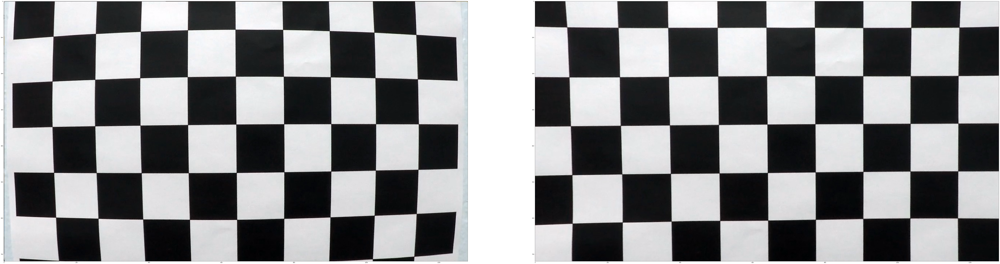

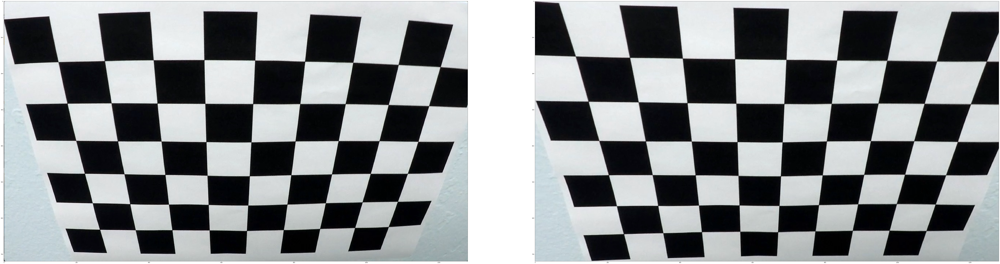

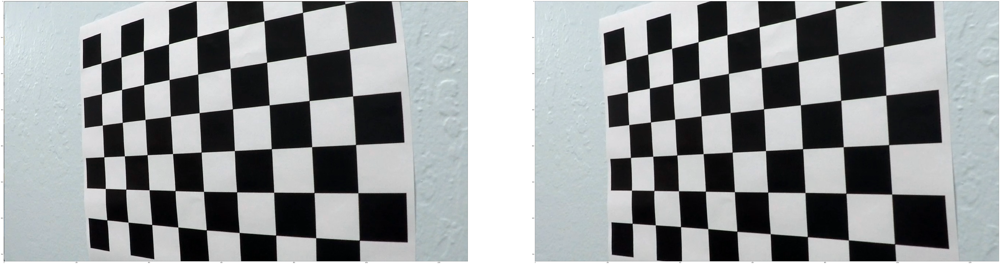

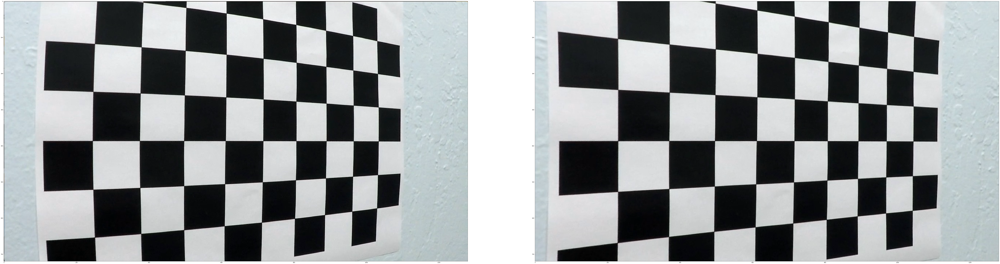

In [4]:
# Check calibration using test images

check_calibration = True

if check_calibration:
    image_samples = ['camera_cal/calibration1.jpg', 'camera_cal/calibration2.jpg', 'camera_cal/calibration4.jpg', 'camera_cal/calibration5.jpg', ]

    for image_name in image_samples:
        img = cv2.imread(image_name)
        undist = camera.undistort(img)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(128, 32))
        fig.tight_layout()
        ax1.imshow(img)
        ax2.imshow(undist)
        plt.show()

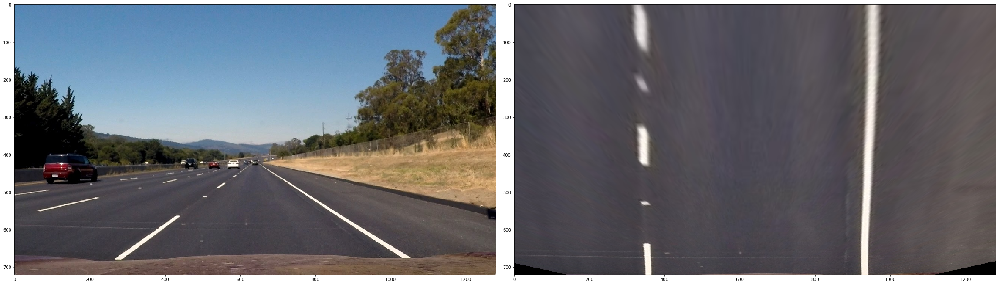

In [5]:
# Perspective transform

class Perspective:
    def __init__(self, src, dst):
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.invM = cv2.getPerspectiveTransform(dst, src)
    def transform(self, image, inverse=False):
        img_size = (image.shape[1], image.shape[0])
        return cv2.warpPerspective(image, self.invM if inverse else self.M, img_size)
    
def getPerspective():
    straight_img = cv2.imread('test_images/straight_lines1.jpg')
    img_size = (straight_img.shape[1], straight_img.shape[0])
    offset = 350
    src = np.float32([[274, 673], [1037, 673], [592, 454], [691, 454]])
    dst = np.float32([[offset, img_size[1]], [img_size[0]-offset, img_size[1]], [offset, 0], [img_size[0]-offset, 0]])
    perspective = Perspective(src, dst)

    visualize = True
    if visualize:
        straight_img = cv2.imread('test_images/straight_lines2.jpg')
        straight_img_perspective = perspective.transform(straight_img)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(32, 32))
        fig.tight_layout()
        ax1.imshow(cv2.cvtColor(straight_img, cv2.COLOR_BGR2RGB))
        ax2.imshow(cv2.cvtColor(straight_img_perspective, cv2.COLOR_BGR2RGB))
        plt.show()
    return perspective

perspective = getPerspective()

In [6]:
class LaneFinder:
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    def __init__(self):
        self.use_history = False
        self.left_fit = []
        self.right_fit = []
        self.margin = 100    # Set the width of the windows +/- margin
        
    def useHistory(self, use=True):
        self.use_history = use
        self.left_fit = []
        self.right_fit = []
        
    def find(self, binary_persp, visualize=False):
        if self.use_history and len(self.left_fit) > 0 and len(self.right_fit) > 0:
            lanes_found, left_lane_inds, right_lane_inds = self._findLanesUsingHistory(binary_persp, visualize)
        else:
            lanes_found = False
            
        if not lanes_found:
            left_lane_inds, right_lane_inds = self._findLanes(binary_persp, visualize)
            
        if visualize:
            self._visualizeLanes(binary_persp, left_lane_inds, right_lane_inds)
            
        y_eval = binary_persp.shape[0]
        left_curverad = self._worldCurvature(self.left_fit, y_eval)
        right_curverad = self._worldCurvature(self.right_fit, y_eval)
        
        lane_center = (self._evalFit(self.left_fit, y_eval) + self._evalFit(self.right_fit, y_eval)) / 2
        center_world_offset = (lane_center - binary_persp.shape[1]/2.0) * self.xm_per_pix
            
        return self.left_fit, self.right_fit, left_curverad, right_curverad, center_world_offset
    
    def _findLanes(self, binary_persp, vistualize=False):
        # pure virtual method - must be implemented in derived class
        raise NotImplementedError()
    
    def _findLanesUsingHistory(self, binary_persp, visualize=False):
        assert self.use_history and len(self.left_fit) == 3 and len(self.right_fit) == 3
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_persp")
        # It's now much easier to find line pixels!
        nonzero = binary_persp.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        projected_left_nonzerox = self.left_fit[0]*(nonzeroy**2) + self.left_fit[1]*nonzeroy + self.left_fit[2]
        projected_right_nonzerox = self.right_fit[0]*(nonzeroy**2) + self.right_fit[1]*nonzeroy + self.right_fit[2]
        band_width = self.margin
        left_lane_inds = ((nonzerox > (projected_left_nonzerox - band_width/2)) & (nonzerox < (projected_left_nonzerox + band_width/2))) 
        right_lane_inds = ((nonzerox > (projected_right_nonzerox - band_width/2)) & (nonzerox < (projected_right_nonzerox + band_width/2)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        self.left_fit = np.polyfit(lefty, leftx, 2)
        self.right_fit = np.polyfit(righty, rightx, 2)
        
        return True, left_lane_inds, right_lane_inds
    
    def _visualizeLanes(self, binary_persp, left_lane_inds, right_lane_inds):
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_persp, binary_persp, binary_persp))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        nonzero = binary_persp.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_persp.shape[0]-1, binary_persp.shape[0] )
        left_fitx = self.left_fit[0]*ploty**2 + self.left_fit[1]*ploty + self.left_fit[2]
        right_fitx = self.right_fit[0]*ploty**2 + self.right_fit[1]*ploty + self.right_fit[2]
        
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-self.margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+self.margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-self.margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+self.margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.figure()
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, binary_persp.shape[1])
        plt.ylim(binary_persp.shape[0], 0)
        
    def _evalFit(self, fit, y_eval):
        return (fit[0] * y_eval * y_eval + fit[1] * y_eval + fit[2])
    
    def _curvature(self, fit, y_eval):
        curverad = ((1 + (2*fit[0]*y_eval + fit[1])**2)**1.5) / np.absolute(2*fit[0])
        return curverad
    
    def _worldCurvature(self, fit, y_eval):
        fit_world = self.xm_per_pix * fit
        fit_world[0] /= (self.ym_per_pix**2)
        fit_world[1] /= self.ym_per_pix
        
        y_world_eval = y_eval * self.ym_per_pix
        
        #x_eval = self._evalFit(fit, y_eval)
        #x_world_eval = self._evalFit(fit_world, y_world_eval)
        #print(x_world_eval, x_eval*self.xm_per_pix)
        
        return self._curvature(fit_world, y_world_eval)
        

In [7]:
class LaneFinderUsingHistogram(LaneFinder):
    def __init__(self):
        super().__init__()
    
    def _findLanes(self, binary_persp, visualize=False):
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image

        histogram = np.sum(binary_persp[np.int(binary_persp.shape[0]/2):,:], axis=0)
        
        if visualize:
            plt.figure()
            plt.plot(histogram)
    
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_persp.shape[0] / nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_persp.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        
        # Set minimum number of pixels found to recenter window
        minpix = 100
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
    
        if visualize:
            # Create an output image to draw on and  visualize the result
            out_img = np.dstack((binary_persp, binary_persp, binary_persp))*255

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_persp.shape[0] - (window+1)*window_height
            win_y_high = binary_persp.shape[0] - window*window_height
            win_xleft_low = leftx_current - self.margin
            win_xleft_high = leftx_current + self.margin
            win_xright_low = rightx_current - self.margin
            win_xright_high = rightx_current + self.margin
            # Draw the windows on the visualization image
            if visualize:
                cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
                cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        self.left_fit = np.polyfit(lefty, leftx, 2)
        self.right_fit = np.polyfit(righty, rightx, 2)
      
        if visualize:
            # Generate x and y values for plotting
            ploty = np.linspace(0, binary_persp.shape[0]-1, binary_persp.shape[0] )
            left_fitx = self.left_fit[0]*ploty**2 + self.left_fit[1]*ploty + self.left_fit[2]
            right_fitx = self.right_fit[0]*ploty**2 + self.right_fit[1]*ploty + self.right_fit[2]
    
            out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
            out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
            plt.figure()
            plt.imshow(out_img)
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')
            plt.xlim(0, 1280)
            plt.ylim(720, 0)
        
        return left_lane_inds, right_lane_inds

In [8]:
class LaneFinderUsingConvolution(LaneFinder):
    def __init__(self):
        super().__init__()
        # window settings
        self.window_width = 50 
        self.window_height = 80 # Break image into 9 vertical layers since image height is 720
        self.margin = 100 # How much to slide left and right for searching

    def windowMask(self, img_ref, center, level):
        output = np.zeros_like(img_ref)
        output[int(img_ref.shape[0]-(level+1)*self.window_height):int(img_ref.shape[0]-level*self.window_height),max(0,int(center-self.window_width/2)):min(int(center+self.window_width/2),img_ref.shape[1])] = 1
        return output

    def findWindowCentroids(self, image):
    
        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(self.window_width) # Create our window template that we will use for convolutions
    
        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 
    
        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(image[int(3*image.shape[0]/4):, :int(image.shape[1]/2)], axis=0)
        l_center = np.argmax(np.convolve(window,l_sum))-self.window_width/2
        r_sum = np.sum(image[int(3*image.shape[0]/4):, int(image.shape[1]/2):], axis=0)
        r_center = np.argmax(np.convolve(window,r_sum))-self.window_width/2+int(image.shape[1]/2)
    
        # Add what we found for the first layer
        window_centroids.append((l_center, r_center))
    
        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(image.shape[0]/self.window_height)):
            # convolve the window into the vertical slice of the image
            image_layer = np.sum(image[int(image.shape[0]-(level+1)*self.window_height):int(image.shape[0]-level*self.window_height),:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = self.window_width/2
            l_min_index = int(max(l_center+offset-self.margin, 0))
            l_max_index = int(min(l_center+offset+self.margin, image.shape[1]))
            l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-self.margin,0))
            r_max_index = int(min(r_center+offset+self.margin, image.shape[1]))
            r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            # Add what we found for that layer
            window_centroids.append((l_center, r_center))

        return window_centroids

    def _findLanes(self, binary_persp, visualize=False):
        
        window_centroids = self.findWindowCentroids(binary_persp)

        # If we found any window centers
        if len(window_centroids) > 0:

            # Identify the x and y positions of all nonzero pixels in the image
            nonzero = binary_persp.nonzero()
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            
            left_lane_inds = []
            right_lane_inds = []
        
            # Points used to draw all the left and right windows
            if visualize:
                l_points = np.zeros_like(binary_persp)
                r_points = np.zeros_like(binary_persp)

            # Go through each level and draw the windows 	
            for level in range(0, len(window_centroids)):
                # Identify window boundaries in x and y (and right and left)
                win_y_low = binary_persp.shape[0] - (level+1)*self.window_height
                win_y_high = binary_persp.shape[0] - level*self.window_height
                win_xleft_low = window_centroids[level][0] - self.window_width/2
                win_xleft_high = window_centroids[level][0] + self.window_width/2
                win_xright_low = window_centroids[level][1] - self.window_width/2
                win_xright_high = window_centroids[level][1] + self.window_width/2
                 
                # Identify the nonzero pixels in x and y within the window
                good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
                # Append these indices to the lists
                left_lane_inds.append(good_left_inds)
                right_lane_inds.append(good_right_inds)
                
                if visualize:
                    # Window_mask is a function to draw window areas
                    l_mask = self.windowMask(binary_persp, window_centroids[level][0], level)
                    r_mask = self.windowMask(binary_persp, window_centroids[level][1], level)
                    # Add graphic points from window mask here to total pixels found 
                    l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
                    r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

            # Concatenate the arrays of indices
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)

            # Extract left and right line pixel positions
            leftx = nonzerox[left_lane_inds]
            lefty = nonzeroy[left_lane_inds] 
            rightx = nonzerox[right_lane_inds]
            righty = nonzeroy[right_lane_inds] 

            # Fit a second order polynomial to each
            self.left_fit = np.polyfit(lefty, leftx, 2)
            self.right_fit = np.polyfit(righty, rightx, 2)
        
            # Draw the results
            if visualize:
                template = np.array(r_points+l_points, np.uint8) # add both left and right window pixels together
                zero_channel = np.zeros_like(template) # create a zero color channel
                template = np.array(cv2.merge((zero_channel, template, zero_channel)),np.uint8) # make window pixels green
                warpage = np.array(cv2.merge((binary_persp, binary_persp, binary_persp)),np.uint8) # making the original road pixels 3 color channels
                output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
        # If no window centers found, just display orginal road image
        else:
            assert False
            #output = np.array(cv2.merge((binary_persp, binary_persp, binary_persp)),np.uint8)

        if visualize:
            # Display the final results
            plt.figure()
            plt.imshow(output)
            plt.title('window fitting results')
            plt.show()
        return left_lane_inds, right_lane_inds

In [9]:
def anotateLanes(perspective, undist, binary_persp, left_fit, right_fit, left_curverad, right_curverad, center_offset):
    # Create an image to draw the lines on
    persp_zero = np.zeros_like(binary_persp).astype(np.uint8)
    color_persp = np.dstack((persp_zero, persp_zero, persp_zero))
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_persp.shape[0]-1, binary_persp.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_persp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    lanes = perspective.transform(color_persp, inverse=True) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, lanes, 0.3, 0)
    
    # Project curvature radius and center offset
    text = 'curvature radius: (' + str(left_curverad) + 'm, ' + str(right_curverad) + 'm)'
    cv2.putText(result, text, (50, 50),  cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    text = 'offset from lane center: ' + str(center_offset) + 'm'
    cv2.putText(result, text, (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    return result

In [10]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.

def scaleFloatsToInt8(x):
    return np.uint8(255*x/np.max(x))

def thresholdMask(data, thresh):
    return (data >= thresh[0]) & (data <= thresh[1])
                     
def thresholdedBinaryImage(img):
    # Convert to HSV color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Calculate the x and y gradients
    sobel_kernel=7
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
                     
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Take the absolute value of the gradient direction
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    # Rescale back to 8 bit integer
    scaled_sobelx = scaleFloatsToInt8(abs_sobelx)
    scaled_sobely = scaleFloatsToInt8(abs_sobely)    
    scaled_gradmag = scaleFloatsToInt8(gradmag)
    
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(gray)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    mask = thresholdMask(scaled_sobelx, (30, 100)) | thresholdMask(s_channel, (170, 255)) 
    binary_output[mask] = 1
    
    # Apply region of interest
    imshape = gray.shape
    offset = 20
    vertices = np.array([[(offset,imshape[0]),(imshape[1]/2, imshape[0]/2+50), (imshape[1]-offset,imshape[0])]], dtype=np.int32)
    region_mask = np.zeros_like(gray)       
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(region_mask, vertices, 255)
    
    #returning the image only where mask pixels are nonzero
    binary_output = cv2.bitwise_and(binary_output, region_mask)
    
    return binary_output

In [11]:
lane_finder = LaneFinderUsingHistogram()
    
def laneFindingPipeline(camera, perspective, image, visualize=False):
    undist = camera.undistort(image)
    binary = thresholdedBinaryImage(undist)
    binary_persp = perspective.transform(binary)
    
    if visualize:
        # Plot the result
        f, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(64, 16))
        f.tight_layout()

        ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image')

        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Result')
        
        ax3.imshow(binary, cmap='gray')
        ax3.set_title('Thresholded Binary Output')
        
        ax4.imshow(binary_persp, cmap='gray')
        ax4.set_title('Warped Binary Result')
        
        plt.show()
    left_fit, right_fit, left_curverad, right_curverad, center_offset = lane_finder.find(binary_persp, visualize)
    
    undist_w_lanes = anotateLanes(perspective, undist, binary_persp, left_fit, right_fit, left_curverad, right_curverad, center_offset)
        
    return undist_w_lanes

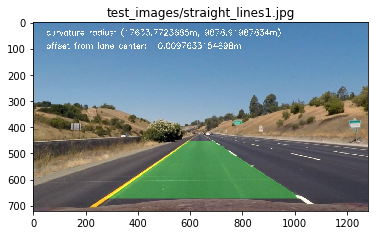

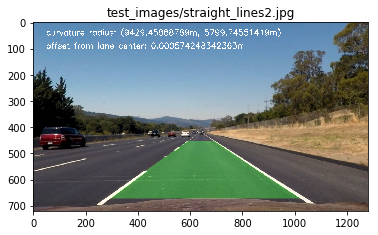

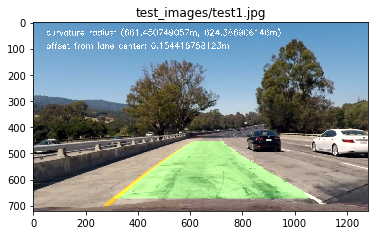

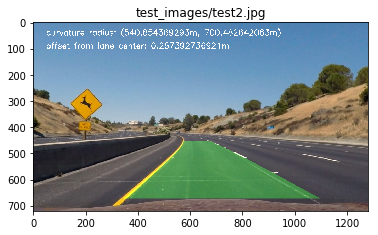

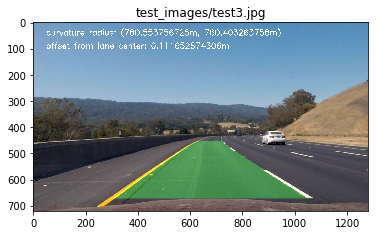

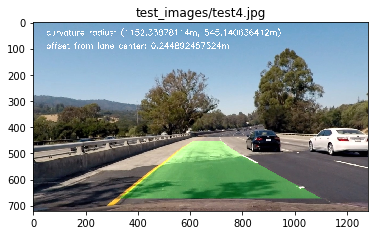

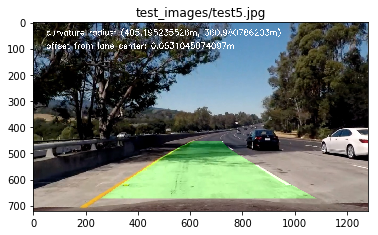

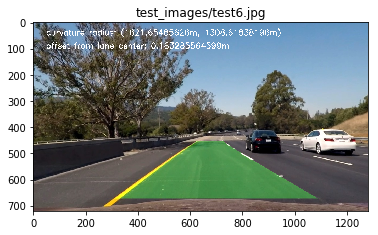

In [12]:
lane_finder.useHistory(False)
test_images = glob.glob('test_images/*.jpg')
#test_images = glob.glob('tmp/image582.jpg')
#test_images = glob.glob('tmp/image1050.jpg')
#test_images = glob.glob('tmp/image1049.jpg')
for imagefile in test_images:
    test_img = cv2.imread(imagefile)
    result = laneFindingPipeline(camera, perspective, test_img, visualize=False)
    plt.figure()
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(imagefile)

In [13]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [14]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    result = laneFindingPipeline(camera, perspective, image)
    process_image.imgcount += 1
    if process_image.imgcount <= process_image.maxcount:
        cv2.imwrite('tmp/image'+str(process_image.imgcount)+'.jpg', cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        cv2.imwrite('tmp/result'+str(process_image.imgcount)+'.jpg', cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
    return result
process_image.imgcount = 0
process_image.maxcount = 0


In [15]:
lane_finder.useHistory(True)
video_output = 'project_video_w_lanes.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_w_lanes.mp4
[MoviePy] Writing video project_video_w_lanes.mp4


100%|█████████▉| 1260/1261 [08:26<00:00,  4.83it/s] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_w_lanes.mp4 

CPU times: user 4min 44s, sys: 4min 50s, total: 9min 34s
Wall time: 8min 26s
Compiler : 170 ms
Parser   : 153 ms


In [16]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))